In [3]:
from pykml import parser
import pandas as pd
import numpy as np
import requests
# Parse the KML file
with open('D74.kml', 'r') as kml_file:
    kml_doc = parser.parse(kml_file).getroot()
altitudeMode = kml_doc.Document.Placemark.getchildren()[2].getchildren()[0]


attributes = kml_doc.findall(

    ".//{http://www.google.com/kml/ext/2.2}SimpleArrayData")

times = list(kml_doc.getchildren()[0].Placemark.getchildren()[2].findall(
    ".//{http://www.opengis.net/kml/2.2}when"))
coords = list(kml_doc.getchildren()[0].Placemark.getchildren()[2].findall(
    ".//{http://www.google.com/kml/ext/2.2}coord"))
print(len(times), " times loaded")
print(len(coords), " coordinates loaded")
acc_horiz = []
acc_vert = []
course = []
speed_kts = []
altitude = []
bank = []
pitch = []
for param in attributes:
    if param.get("name") == 'acc_horiz':
        for attr in param.getchildren():
            acc_horiz.append(attr.text)
    elif param.get("name") == 'acc_vert':
        for attr in param.getchildren():
            acc_vert.append(attr.text)
    elif param.get("name") == 'course':
        for attr in param.getchildren():
            course.append(attr.text)
    elif param.get("name") == 'speed_kts':
        for attr in param.getchildren():
            speed_kts.append(attr.text)
    elif param.get("name") == 'altitude':
        for attr in param.getchildren():
            altitude.append(attr.text)
    elif param.get("name") == 'bank':
        for attr in param.getchildren():
            bank.append(attr.text)
    elif param.get("name") == 'pitch':
        for attr in param.getchildren():
            pitch.append(attr.text)


times = [str(t) for t in times]
coords = [str(c) for c in coords]

print("Altitude Mode:", altitudeMode)
print(len(bank))
print(len(pitch))
print(len(altitude))
print(len(speed_kts))
print(len(course))
print(len(acc_vert))
print(len(acc_horiz))


7935  times loaded
7935  coordinates loaded
Altitude Mode: absolute
7935
7935
7935
7935
7935
7935
7935


In [4]:
data = [times, coords, bank, pitch, altitude, speed_kts, course, acc_horiz, acc_vert]

# Transpose the array using the zip() function
data = [list(x) for x in zip(*data)]

data = pd.DataFrame(data, columns =  ['times', 'coords', 'bank', 'pitch', 'altitude', 'speed_kts', 'course', 'acc_horiz', 'acc_vert'])

data[['longitude', 'latitude', 'heading']] = data['coords'].str.split(' ', expand=True)

data.drop('coords', axis=1, inplace=True)

data['timestamp'] = pd.to_datetime(data['times'])
data['bank'] = data['bank'].astype(float)
data['pitch'] = data['pitch'].astype(float)
data['altitude'] = data['altitude'].astype(float)
data['speed_kts'] = data['speed_kts'].astype(float)
data['course'] = data['course'].astype(float)

data['latitude'] = data['latitude'].astype(float)
data['longitude'] = data['longitude'].astype(float)
data['heading'] = data['heading'].astype(float)


data['acc_horiz'] = data['acc_horiz'].astype(int)
data['acc_vert'] = data['acc_vert'].astype(int)

data.set_index('timestamp', inplace=True)
data

,times,bank,pitch,altitude,speed_kts,course,acc_horiz,acc_vert,longitude,latitude,heading
timestamp,,,,,,,,,,,
2023-09-02 19:22:23.252193927+00:00,2023-09-02T19:22:23.252193927Z,NaN,NaN,47.06,0.00,-1.00,78,9,-76.566126,38.940666,14.3
2023-09-02 19:22:26.916180133+00:00,2023-09-02T19:22:26.916180133Z,NaN,NaN,47.06,0.00,-1.00,78,9,-76.566126,38.940666,14.3
2023-09-02 19:22:28.039920091+00:00,2023-09-02T19:22:28.039920091Z,NaN,NaN,47.06,8.28,305.86,47,256,-76.566005,38.941265,-100000.0
2023-09-02 19:22:29.984860897+00:00,2023-09-02T19:22:29.984860897Z,NaN,NaN,55.25,8.28,160.66,13,16,-76.566025,38.941229,16.8
2023-09-02 19:22:30.994791030+00:00,2023-09-02T19:22:30.994791030Z,NaN,NaN,26.26,0.00,0.00,8,12,-76.566000,38.941294,8.0
...,...,...,...,...,...,...,...,...,...,...,...
2023-09-02 21:47:28.000387191+00:00,2023-09-02T21:47:28.000387191Z,NaN,NaN,34.23,0.00,307.27,3,3,-76.565083,38.940796,10.4
2023-09-02 21:47:29.000374794+00:00,2023-09-02T21:47:29.000374794Z,NaN,NaN,34.31,0.00,307.27,3,3,-76.565083,38.940796,10.5
2023-09-02 21:47:30.000366687+00:00,2023-09-02T21:47:30.000366687Z,NaN,NaN,34.28,0.00,307.27,3,3,-76.565083,38.940796,10.4


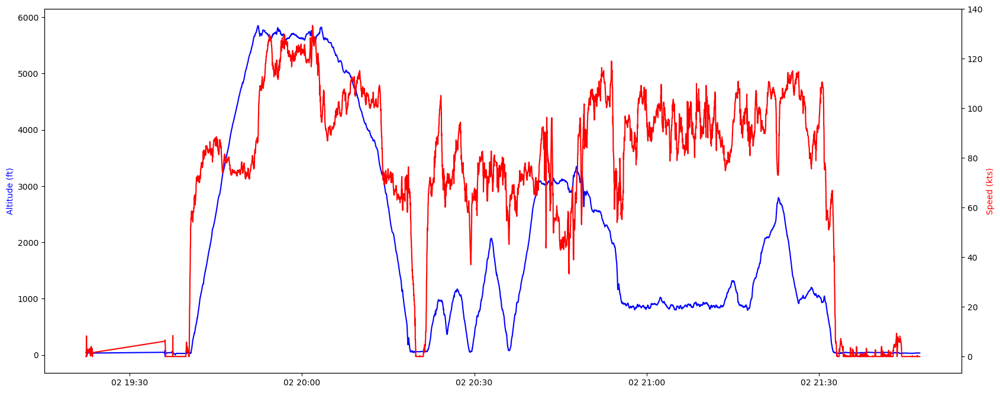

In [51]:
import matplotlib.pyplot as plt
# data['altitude'] = data['altitude'].interpolate(method='linear')
# Create a figure and axis object
fig, ax1 = plt.subplots(figsize=(20, 8))

# Plot the 'altitude' column on the first y-axis
ax1.plot(data['altitude'], color='blue')
ax1.set_ylabel('Altitude (ft)', color='blue')

# Create a second y-axis object
ax2 = ax1.twinx()

# Plot the 'speed_kts' column on the second y-axis
ax2.plot(data['speed_kts'], color='red')
ax2.set_ylabel('Speed (kts)', color='red')

# Show the plot
plt.show()

In [52]:
import requests

def get_elevations():
    elevations = []
    queue = coords
    # print(queue)
    # while len(queue) > 0:

    while len(queue) > 0:
        print(queue)
        print(len(queue))
        start = True
        request = queue[:100]
        locations = ''
        for coord in request:
            lat = coord.split(" ")[1]
            lon = coord.split(" ")[0]
            if not start:
                locations = locations + f'|{lat},{lon}'
            else:
                locations = locations + f'{lat},{lon}'
                start = False
            queue.pop(0)
        print(locations)

        base_url = "https://api.opentopodata.org/v1/ned10m"
        params = {
        'locations': locations,
        'format': 'json'
        }

        try:
            response = requests.get(base_url, params=params)
            data = response.json()
        # print(data)
        # print(response.status_code)
        # Check if the request was successful
            if response.status_code == 200 and 'results' in data:
                for elev in data['results']:
                    elevations.append(float(elev['elevation'] * 3.24))
            else:
                print(f'Error: {data["error"]["message"]}')
        except Exception as e:
            print(f'Error: {str(e)}')
    print(len(elevations))
    return elevations

elevations = get_elevations()
print(elevations)

['-76.566126 38.940666 14.3', '-76.566126 38.940666 14.3', '-76.566005 38.941265 -100000.0', '-76.566025 38.941229 16.8', '-76.566000 38.941294 8.0', '-76.565997 38.941252 6.4', '-76.565996 38.941214 5.8', '-76.565985 38.941206 5.7', '-76.565970 38.941212 4.9', '-76.565950 38.941204 5.3', '-76.565935 38.941192 5.3', '-76.565931 38.941178 5.3', '-76.565908 38.941180 5.7', '-76.565884 38.941170 6.4', '-76.565869 38.941162 9.2', '-76.565862 38.941156 10.5', '-76.565855 38.941149 11.1', '-76.565846 38.941139 12.1', '-76.565837 38.941128 12.5', '-76.565827 38.941119 12.6', '-76.565816 38.941111 12.4', '-76.565801 38.941105 12.8', '-76.565783 38.941097 13.7', '-76.565767 38.941089 14.1', '-76.565757 38.941083 13.7', '-76.565750 38.941075 13.6', '-76.565740 38.941068 12.5', '-76.565732 38.941059 12.1', '-76.565723 38.941051 11.8', '-76.565710 38.941040 12.8', '-76.565697 38.941031 11.8', '-76.565686 38.941024 11.9', '-76.565676 38.941005 12.4', '-76.565667 38.940992 12.3', '-76.565662 38.9409

In [53]:
# airborne = []
fieldElev = elevations[0]
takeoffs = 0
landings = 0
currentlyAirborne = abs(data['altitude'][0] - fieldElev) > 75
for i in range(0, len(data), 50):
    latitude = data['latitude'][i]
    longitude = data['longitude'][i]
    elev = elevations[i]
    difference = abs(data['altitude'][i] - elev)
    print(difference)
    airborne = difference > 75
    if currentlyAirborne == False and airborne:
        currentlyAirborne = True
        takeoffs+=1
    elif currentlyAirborne and airborne == False:
        currentlyAirborne = False
        landings += 1
print(takeoffs, " takeoff(s)", landings, " landing(s)")

15.725952262878419
4.955668106079102
7.24873237609863
11.315064544677728
3.379884185791017
3.7343851089477553
4.1328178787231415
81.32984130859376
566.4014900016786
1111.047600000724
1519.50440448761
2008.086683702469
2487.2
2927.31
3420.46
3871.55
4259.8
4634.27
4924.289837436676
5310.438418273926
5656.09
5782.46
5762.91
5669.14
5690.44768248558
5783.617728691101
5644.959404296876
5581.687540931702
5637.918923645019
5582.615008850098
5552.2199658966065
5635.262565078735
5673.540383377075
5573.090209121704
5750.729714736938
5553.527415161133
5491.190066223145
5274.548851928711
5161.609024200439
4964.929621582031
4942.208512077332
4695.7548564147955
4389.011937026978
4088.3518489837647
3921.915710830688
3756.9128146362305
3470.8768716430664
3105.857329788208
2592.861002998352
2115.5855963134763
1634.6840600585936
1099.0530377197267
387.5415154266357
3.4906235504150374
0.9205744934082034
3.032843780517574
0.1097016906738304
352.14137443542484
717.3868208312988
899.0499391174317
541.96895

<Axes: xlabel='longitude', ylabel='latitude'>

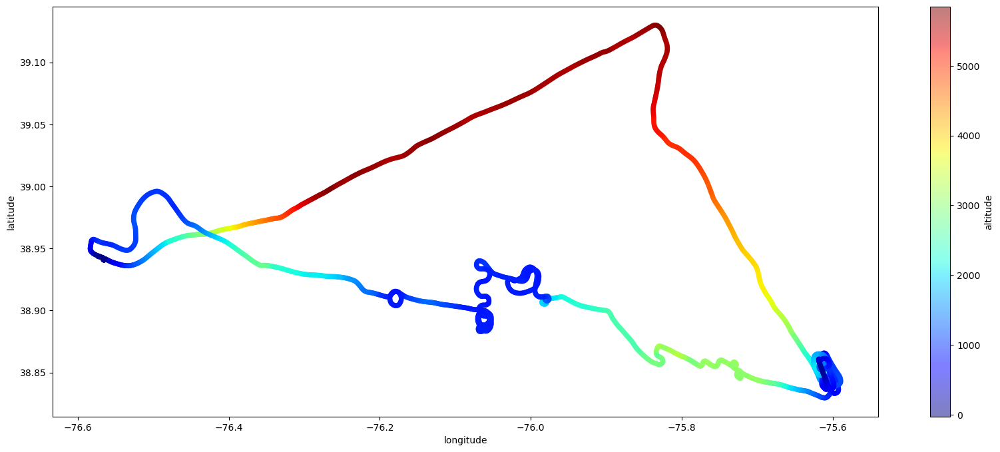

In [54]:
data.plot(x='longitude', y='latitude', kind='scatter', figsize=(20, 8),
          alpha=0.5, c='altitude', cmap=plt.get_cmap('jet'), colorbar=True)


In [55]:

Vr = 50
Vso = 41
Vs1 = 47
Vx = 59
Vy = 73
Vsw = 50
Vref = 60
Vne = 160
Vno = 128
Vmxt = 10



In [ ]:
# airborne = []
fieldElev = elevations[0]
takeoffs = 0
landings = 0
# first element is the size.
segments = []
start = 0
end = 0
currentlyAirborne = abs(data['altitude'][0] - fieldElev) > 75
lastAirborne = True
for i in range(0, len(data), 50):
    latitude = data['latitude'][i]
    longitude = data['longitude'][i]
    elev = elevations[i]

    # if we change, we add it to the list. or if it is the last coordinate. 
    if (currentlyAirborne is lastAirborne) or ((len(data) - 50) <= i <= len(data)):
        end = i 
        status = ""
        if currentlyAirborne:
            status = "grounded"
        else:
            status = "airborne"
        segments.append({"start":start, "end":end,   "status": status})
        start = i
        lastAirborne = not lastAirborne
    difference = abs(data['altitude'][i] - elev)
    # print(difference)
    airborne = difference > 75
    if currentlyAirborne == False and airborne:
        currentlyAirborne = True
        takeoffs+=1
    elif currentlyAirborne and airborne == False:
        currentlyAirborne = False
        landings += 1
        
# print(takeoffs, " takeoff(s)", landings, " landing(s)")

In [16]:
# slow flight 3350-3700, fourth: 3750-7100
start = 0
end = 7100
segments = []
# get the index at the end of the takeoff segment
# and the start of the next landing segment
# for i in range (0, len(segments)):
#     if (segments[i]['status'] == 'airborne'):
#         if (start == 0):
#             start = segments[i]['end']
#     if (segments[i]['status'] == 'grounded'):
#         if (end == 0):
#             end = segments[i]['start']


current_segment_start = None
altitude_threshold_neg = 0
altitude_threshold_pos = 0

for i in range(start, end + 1, 10):
    speed = data['speed_kts'][i]
    altitude = data['altitude'][i]
    if (current_segment_start is None and speed > 45 and speed < 65):
        altitude_threshold_pos = altitude+300
        altitude_threshold_neg = altitude-300
        current_segment_start = i
    if (current_segment_start is not None):
        if (speed > 65 or speed < 45 or altitude < altitude_threshold_neg or altitude > altitude_threshold_pos):
            current_segment_end = i-1
            if (current_segment_end-current_segment_start > 30):
                segments.append({'start': current_segment_start, 'end': current_segment_end, 'status': 'slowflight'})
            current_segment_start = None

# Check if there's an ongoing segment at the end of the data
if current_segment_start is not None:
    current_segment_end = end
    segments.append({'start': current_segment_start, 'end': current_segment_end, 'status': 'slowflight'})
print("segments: ", segments)

    


segments:  [{'start': 3260, 'end': 3299, 'status': 'slowflight'}, {'start': 3620, 'end': 3679, 'status': 'slowflight'}, {'start': 3700, 'end': 3739, 'status': 'slowflight'}, {'start': 4110, 'end': 4269, 'status': 'slowflight'}, {'start': 4280, 'end': 4329, 'status': 'slowflight'}]


C:\Users\ben12\AppData\Local\Temp\ipykernel_4592\2507517164.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  speed = data['speed_kts'][i]
C:\Users\ben12\AppData\Local\Temp\ipykernel_4592\2507517164.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  altitude = data['altitude'][i]
